# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from Kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications, we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

**My Role:** I'm a consultant to a used car dealership.

**Business Problem:** A used car dealership wants to fine-tune their inventory to maximize sales. I have been tasked to identify factors that drive prices of used cars and recommend what customers value in used cars. Based on my recommendations the dealership will adjust their inventory.

**Data Problem:** I need to understand, prepare, and model the available historical data with the objective to find car features that are highly correlated to price and can be used to predict the price of a used car successfully. This involves using exploratory data analysis to identify important features, cleaning and transforming the data, and then training a suitable machine learning model to make predictions. In data science, this is a regression problem to predict price of a used car (a continuous value).

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

<b>A. Steps to understand the data:</b>
1. Explore the data using Pandas Dataframe and its supported functions like info() for schema and datatype info and describe() for basic statistical information.
2. Find features with missing values and undersatnd amount of data with missing values per feature.
3. Find unique values of each feature.
4. Investigate duplicate records.
5. Perform Exploratory Data Analysis (EDA) on the dataset by generating appropriate plots.
6. Observe numerical vs categorical features of the data.
7. Observe features that are not correlated to price of used cars.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio

In [2]:
# A.1 Load the data
cars_df = pd.read_csv('data/vehicles.csv')
cars_df

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,NaN,sedan,NaN,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,NaN,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.0,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy


In [3]:
# A.1.1 Finding summary of the dataset (schema with datatypes)
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [4]:
# A.1.2 Finding statistical summary of the dataset
cars_df.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [5]:
# A.2 Finding percentage of records with missing values for each feature
np.round(cars_df.isna().mean()*100, 2)

id               0.00
region           0.00
price            0.00
year             0.28
manufacturer     4.13
model            1.24
condition       40.79
cylinders       41.62
fuel             0.71
odometer         1.03
title_status     1.93
transmission     0.60
VIN             37.73
drive           30.59
size            71.77
type            21.75
paint_color     30.50
state            0.00
dtype: float64

In [6]:
# A.3 Finding number of unique values of each feature
for column_name in cars_df:
    unique_values = cars_df[column_name].unique()
    print(f"Number of unique values of {column_name}: {len(unique_values)}")

Number of unique values of id: 426880
Number of unique values of region: 404
Number of unique values of price: 15655
Number of unique values of year: 115
Number of unique values of manufacturer: 43
Number of unique values of model: 29650
Number of unique values of condition: 7
Number of unique values of cylinders: 9
Number of unique values of fuel: 6
Number of unique values of odometer: 104871
Number of unique values of title_status: 7
Number of unique values of transmission: 4
Number of unique values of VIN: 118247
Number of unique values of drive: 4
Number of unique values of size: 5
Number of unique values of type: 14
Number of unique values of paint_color: 13
Number of unique values of state: 51


In [7]:
# A.4 Investigate if there are any duplicate records
# As there are only 118247 unique values for VIN column it seems like there are many records with duplicate VIN values
# Investigate records with duplicate VIN for validity
df_VIN = cars_df.query("VIN.notna() and VIN != '0'")
duplicate_VIN_mask = df_VIN.duplicated(subset=['VIN'], keep=False)
df_duplicate_VIN = df_VIN[duplicate_VIN_mask]
print(f"Number of records with duplicate VIN values: {len(df_VIN)}")
df_duplicate_VIN_sorted = df_duplicate_VIN.sort_values(by='VIN')
df_duplicate_VIN_sorted
# Upon closer look the records with same VIN seem to be valid as the relevant features (like year, manufacturer, model, cylinders, 
# transmission, drive, size, and type) are consistent, indicating the same vehicle.

Number of records with duplicate VIN values: 265813


,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
52708,7316257561,sacramento,29995,1980.0,toyota,pickup,NaN,NaN,other,1.0,clean,other,0000000RN47028886,NaN,NaN,truck,NaN,ca
248067,7314366584,las vegas,29995,1980.0,toyota,pickup,NaN,NaN,other,1.0,clean,other,0000000RN47028886,NaN,NaN,truck,NaN,nv
10177,7316776056,phoenix,29995,1980.0,toyota,pickup,NaN,NaN,other,1.0,clean,other,0000000RN47028886,NaN,NaN,truck,NaN,az
306963,7307781868,oklahoma city,48999,1970.0,ford,mustang,NaN,NaN,other,76167.0,clean,automatic,0000000T05H107426,NaN,NaN,NaN,NaN,ok
234518,7307778278,charlotte,48999,1970.0,ford,mustang,NaN,NaN,other,76167.0,clean,automatic,0000000T05H107426,NaN,NaN,NaN,NaN,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
323095,7316693493,portland,58991,2020.0,NaN,Maserati Levante,excellent,NaN,gas,24183.0,clean,automatic,ZN661YUA4LX344692,NaN,NaN,NaN,black,or
7088,7306965446,anchorage / mat-su,53995,2017.0,NaN,Maserati Levante S,excellent,6 cylinders,gas,27300.0,clean,automatic,ZN661YUS0HX263351,4wd,full-size,SUV,grey,ak
5895,7312984498,anchorage / mat-su,53995,2017.0,NaN,Maserati Levante S,excellent,6 cylinders,gas,27300.0,clean,automatic,ZN661YUS0HX263351,4wd,full-size,SUV,grey,ak
9080,7306378728,flagstaff / sedona,229500,2019.0,NaN,Lamborghini Urus,NaN,8 cylinders,gas,32922.0,clean,automatic,ZPBUA1ZL1KLA02237,4wd,compact,SUV,white,az


<b>A.5 <mark>Exploratory Data Analysis (EDA) </mark></b>

In [80]:
# A.5.1 Scatter plot of 'price' against 'year' with color by 'manufacturer' and observe the price outliers
fig = px.scatter(cars_df, x='year', y='price', color='manufacturer')
fig.update_layout(title={'text': 'A.5.1.0 - Scatter plot of used car price against year built, colored by manufacturer','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/A.5.1.0_scatter_plot_price_against_year.html")
# fig.show() # commented to reduce notebook file size

In [43]:
# A.5.1.1 Scatter plot of 'price' against 'year' with color by 'manufacturer'
# Limiting the price greater than zero and less than $350,000
fig = px.scatter(cars_df.query('price > 0 & price < 350000'), x='year', y='price', color='manufacturer')
fig.update_layout(title={'text': 'A.5.1.1 - Scatter plot of used car price against year built, colored by manufacturer','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/A.5.1.1_scatter_plot_price_against_year.html")
# fig.show() # commented to reduce notebook file size

In [79]:
# A.5.2 Scatter plot of 'price' against 'odometer' with color by 'manufacturer' and observe the price and odomerter outliers
fig = px.scatter(cars_df, x='odometer', y='price', color='manufacturer')
fig.update_layout(title={'text': 'A.5.2.0 - Scatter plot of used car price against odometer, colored by manufacturer','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/A.5.2.0_scatter_plot_price_against_odometer.html")
# fig.show() # commented to reduce notebook file size

In [76]:
# A.5.2.1 Scatter plot of 'price' against 'odometer' with color by 'manufacturer'
# Limiting the price greater than zero and less than $350,000
# Limiting the odometer reading less than $3,500,000
fig = px.scatter(cars_df.query('price > 0 & price < 350000 & odometer < 3500000'), x='odometer', y='price', color='manufacturer')
fig.update_layout(title={'text': 'A.5.2.1 - Scatter plot of used car price against odometer, colored by manufacturer','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/A.5.2.1_scatter_plot_price_against_odometer.html")
# fig.show() # commented to reduce notebook file size

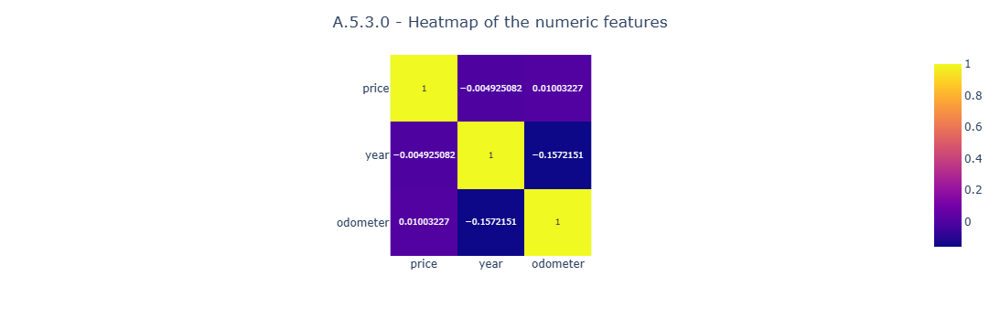

In [47]:
# A.5.3 Heatmap of the numeric features in the dataset to explore corelation
cars_df_numeric = cars_df.select_dtypes(include=np.number)
cars_df_numeric = cars_df_numeric.set_index('id')
fig = px.imshow(cars_df_numeric.corr(), text_auto=True)
fig.update_layout(title={'text': 'A.5.3.0 - Heatmap of the numeric features','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/A.5.3.0_heat_map_numeric_features.html")
fig.show()

**A.6 Data Observations:**
* Total of **426880** records
* Numerical features: **id**, **price**, **year**, and **odometer**
    * **price** ranges from <mark>0 to 3,736,928,711 (presence of outliers on both ends of the range)</mark>
    * **year** ranges from 1900 to 2022
    * **odometer** ranges from <mark>0 to 10,000,000 (presence of outliers on both ends of the range)</mark>
* Categorical features with contained values (candidates for one-hot encoding): **condition**, **cylinders**, **fuel**, **title_status**, **transmission**, **drive**, **size**, **type**, and **paint_color**
* Features with extensive <mark>missing values</mark> are:
    * **condition** with 40.79% missing values
    * **cylinders** with 41.62% missing values
    * **VIN** with 37.73% missing values
    * **drive** with 30.59% missing values
    * **size** with 71.77% missing values
    * **type** with 21.75% missing values
    * **paint_color** with 30.5% missing values
* Features that are most likely to be correlated to price of used cars are **year** and **odometer**
* Features that are not correlated to price to price of used cars are **id** and **VIN**

### Data Preparation

After our initial exploration and fine-tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

<b>B. Steps to prepare the data:</b>
1. Drop records with all the feature values missing.
2. Drop features that are not related to the price of used cars.
3. Drop records with missing values of the numerical features (as we are not considering imputing any missing values).
4. Handle categorical features for one-hot encoding.
5. Handle outliers in the data.
6. Create modeling data with all numerical features using one-hot encoding.

In [20]:
# B.1 Drop the 68 records with all value missing as such records are invalid for analysis
features_with_missing_values = ['year','manufacturer','model','condition','cylinders','fuel','odometer',
                                'title_status','transmission','VIN','drive','size','type','paint_color']
cars_df_valid = cars_df.dropna(subset=features_with_missing_values, how='all')
print(f"Number of records remaining in the dataset: {len(cars_df_valid)}")

Number of records remaining in the dataset: 426812


In [21]:
# B.2 Drop features id and VIN as they do not help in predicting the price of used cars
# B.2.1 Rename features to their short names
cars_df_valid = cars_df_valid.drop(['id', 'VIN'], axis=1)
cars_df_valid = cars_df_valid.rename(columns={'manufacturer': 'mfr', 'condition': 'cond', 'cylinders': 'cyl', 
                                              'odometer': 'odo', 'title_status': 'title', 'transmission': 'trans', 'paint_color': 'color'})
cars_df_valid.info()

<class 'pandas.core.frame.DataFrame'>
Index: 426812 entries, 27 to 426879
Data columns (total 16 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   region  426812 non-null  object 
 1   price   426812 non-null  int64  
 2   year    425675 non-null  float64
 3   mfr     409234 non-null  object 
 4   model   421603 non-null  object 
 5   cond    252776 non-null  object 
 6   cyl     249202 non-null  object 
 7   fuel    423867 non-null  object 
 8   odo     422480 non-null  float64
 9   title   418638 non-null  object 
 10  trans   424324 non-null  object 
 11  drive   296313 non-null  object 
 12  size    120519 non-null  object 
 13  type    334022 non-null  object 
 14  color   296677 non-null  object 
 15  state   426812 non-null  object 
dtypes: float64(2), int64(1), object(13)
memory usage: 55.4+ MB


In [22]:
# B.3 Drop 5,468 records with missing values in numerical features year and odometer
# We can drop these records as it does not cause significant reduction in sample size
cars_df_valid = cars_df_valid.dropna(subset=['year','odo'])
print(f"Number of records remaining in the dataset: {len(cars_df_valid)}")

Number of records remaining in the dataset: 421344


<b>B.4 Handle categorical features to enable one-hot encoding</b>

In [23]:
# B.4.1 Fill missing values of all the categorical features with 'other'
cars_df_valid = cars_df_valid.fillna('other')

In [24]:
# B.4.2 Counts of unique values for each categorical feature in the dataset
for column_name in cars_df_valid:
    if cars_df_valid.dtypes[column_name] == 'object':
        print(f"Feature: {cars_df_valid[column_name].value_counts()}\n")

Feature: region
columbus                   3608
jacksonville               3522
spokane / coeur d'alene    2985
new hampshire              2979
sarasota-bradenton         2975
                           ... 
meridian                     28
southwest MS                 14
kansas city                  11
fort smith, AR                9
west virginia (old)           8
Name: count, Length: 404, dtype: int64

Feature: mfr
ford               70313
chevrolet          54414
toyota             33790
honda              21026
nissan             18818
jeep               18814
ram                18227
gmc                16609
other              16267
bmw                14609
dodge              13546
mercedes-benz      11595
hyundai            10223
subaru              9422
volkswagen          9252
kia                 8352
lexus               8132
audi                7528
cadillac            6871
chrysler            5956
acura               5938
buick               5452
mazda               5373
infi

<b>B.4.3 <mark>There are 404 unique values for region. Need to reduce them to support one-hot encoding and avoid the curse of dimensionality.</mark></b>

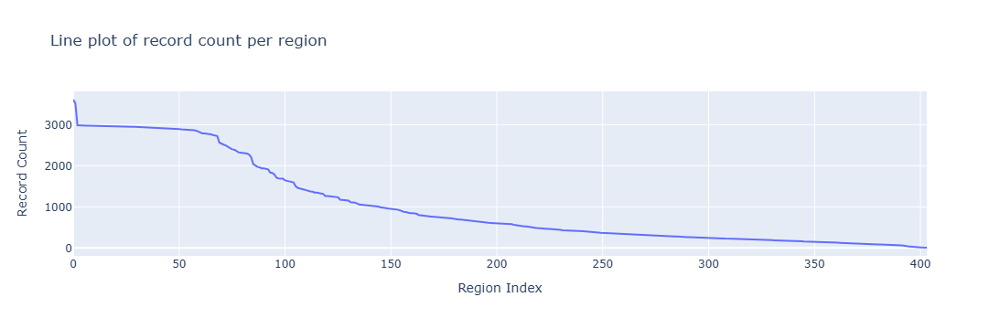

In [25]:
# B.4.3.1 Line plot of record count per region
regions = cars_df_valid['region'].value_counts()
fig = px.line(x=range(len(regions)), y=regions, title="Line plot of record count per region")
fig.update_layout(xaxis_title="Region Index", yaxis_title="Record Count")
fig.show()

In [26]:
# B.4.3.2 Keeping the top 87 regions (with 2000 or more record counts) and making all the remaining regions as 'other'
regions_replace = regions[87:].index.to_numpy()
cars_df_valid['region'] = cars_df_valid['region'].replace(regions_replace, 'other')
new_regions = cars_df_valid['region'].value_counts()
new_regions

region
other                      177019
columbus                     3608
jacksonville                 3522
spokane / coeur d'alene      2985
new hampshire                2979
                            ...  
bellingham                   2299
greenville / upstate         2271
akron / canton               2210
western massachusetts        2039
buffalo                      2000
Name: count, Length: 88, dtype: int64

<b>B.4.4 <mark>There are 43 unique values for manufacturer. Need to reduce them to support one-hot encoding and avoid the curse of dimensionality.</mark></b>

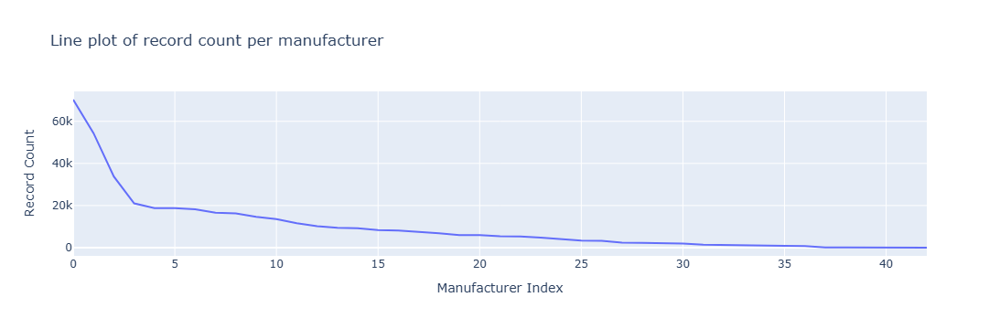

In [27]:
# B.4.4.1 Line plot of record count per manufacturer
mfrs = cars_df_valid['mfr'].value_counts()
fig = px.line(x=range(len(mfrs)), y=mfrs, title="Line plot of record count per manufacturer")
fig.update_layout(xaxis_title="Manufacturer Index", yaxis_title="Record Count")
fig.show()

In [28]:
# B.4.4.2 Keeping the top 13 manufacturers (with 10000 or more record counts) and making all the remaining manufacturers as 'other'
mfr_replace = mfrs[13:].index.to_numpy()
cars_df_valid['mfr'] = cars_df_valid['mfr'].replace(mfr_replace, 'other')
mfrs2 = cars_df_valid['mfr'].value_counts()
mfrs2

mfr
other            119360
ford              70313
chevrolet         54414
toyota            33790
honda             21026
nissan            18818
jeep              18814
ram               18227
gmc               16609
bmw               14609
dodge             13546
mercedes-benz     11595
hyundai           10223
Name: count, dtype: int64

<b>B.4.5 <mark>There are 29,219 unique values for model. Need to reduce them to support one-hot encoding and avoid the curse of dimensionality.</mark></b>

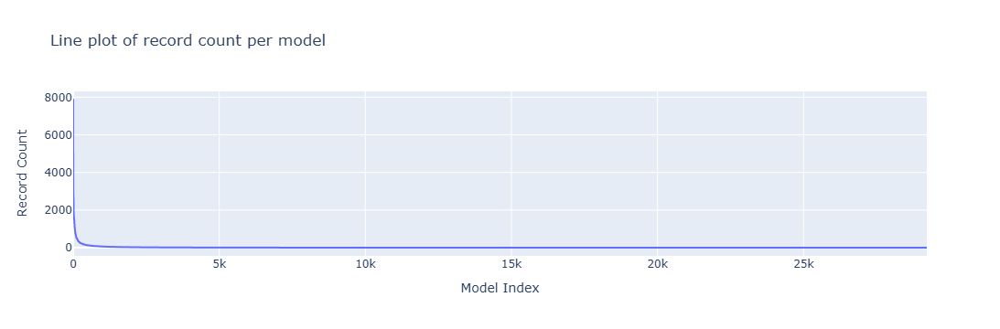

In [29]:
# B.4.5.1 Line plot of record count against model
models = cars_df_valid['model'].value_counts()
fig = px.line(x=range(len(models)), y=models, title="Line plot of record count per model")
fig.update_layout(xaxis_title="Model Index", yaxis_title="Record Count")
fig.show()

In [30]:
# B.4.5.2 Keeping the top 58 car models (with 1000 or more record counts) and making all the remaining models as 'other'
# models_replace = models[58:].index.to_numpy()
# cars_df_valid['model'] = cars_df_valid['model'].replace(models_replace, 'other')
# The above code kept running and had to be forcefully terminated after 8 minutes (may be due to extremely large array length)
# Another way of achieveing the same (completed in less than 1 minute)
cars_df_valid['model'] = cars_df_valid['model'].apply(lambda m: m if str(m) in models[:58] else 'other')
models2 = cars_df_valid['model'].value_counts()
models2

model
other                 311634
f-150                   7870
silverado 1500          5043
1500                    4178
camry                   3070
silverado               2991
accord                  2925
wrangler                2786
civic                   2775
altima                  2719
escape                  2709
2500                    2675
tacoma                  2528
explorer                2480
grand cherokee          2467
mustang                 2210
corolla                 2196
equinox                 1938
fusion                  1924
cr-v                    1899
focus                   1787
malibu                  1735
charger                 1692
tahoe                   1688
rav4                    1661
sonata                  1658
corvette                1655
impala                  1638
sierra 1500             1619
grand caravan           1585
outback                 1537
silverado 2500hd        1529
cruze                   1526
f-250                   1522
3500    

<b>B.4.6 <mark>There are 51 unique values for state. Need to reduce them to support one-hot encoding and avoid the curse of dimensionality.</mark></b>

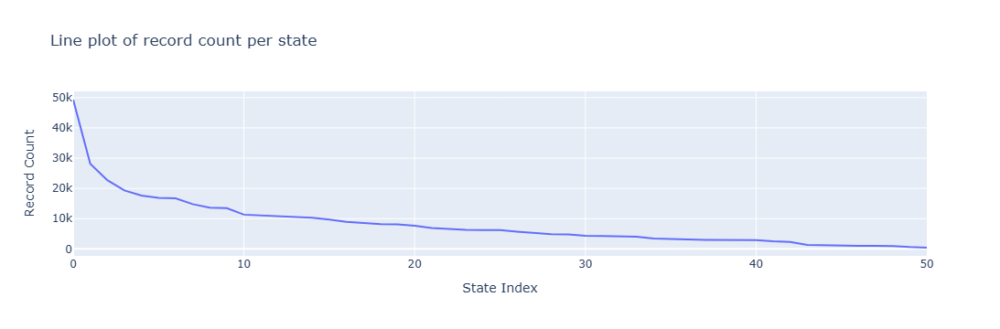

In [31]:
# B.4.6.1 Line plot of record count against state
states = cars_df_valid['state'].value_counts()
fig = px.line(x=range(len(states)), y=states, title="Line plot of record count per state")
fig.update_layout(xaxis_title="State Index", yaxis_title="Record Count")
fig.show()

In [32]:
# B.4.6.2 Keeping the top 15 states (with 10000 or more record counts) and making all the remaining states as 'other'
states_replace = states[15:].index.to_numpy()
cars_df_valid['state'] = cars_df_valid['state'].replace(states_replace, 'other')
states2 = cars_df_valid['state'].value_counts()
states2

state
other    154599
ca        49345
fl        28117
tx        22711
ny        19333
oh        17637
mi        16860
or        16732
nc        14799
pa        13626
wa        13491
wi        11320
tn        11035
co        10926
va        10511
il        10302
Name: count, dtype: int64

In [33]:
# B.4.7 Updated number of unique values of each feature after data cleanup and handling categorical features
for column_name in cars_df_valid:
    unique_values = cars_df_valid[column_name].unique()
    print(f"Number of unique values of {column_name}: {len(unique_values)}")

Number of unique values of region: 88
Number of unique values of price: 15508
Number of unique values of year: 113
Number of unique values of mfr: 13
Number of unique values of model: 58
Number of unique values of cond: 7
Number of unique values of cyl: 8
Number of unique values of fuel: 5
Number of unique values of odo: 104630
Number of unique values of title: 7
Number of unique values of trans: 3
Number of unique values of drive: 4
Number of unique values of size: 5
Number of unique values of type: 13
Number of unique values of color: 13
Number of unique values of state: 16


<b>B.5 <mark>Handling Outliers.</mark></b>

In [34]:
# B.5.1 Defining price outliers
price_upper_limit = cars_df_valid['price'].quantile(0.999)
price_lower_limit = cars_df_valid['price'].quantile(0.1)
print(f"Price outliers: greater than {price_upper_limit} and lesser than {price_lower_limit}")

Price outliers: greater than 120000.0 and lesser than 700.0


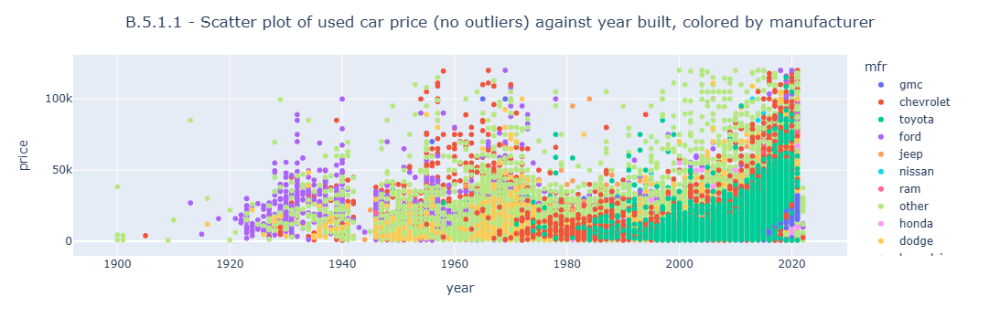

In [49]:
# B.5.1.1 Scatter plot of 'price' against 'year' with color by 'manufacturer'
# Limiting the price greater than price_lower_limit and less than price_upper_limit
fig = px.scatter(cars_df_valid.query('price > @price_lower_limit & price < @price_upper_limit'), x='year', y='price', color='mfr')
fig.update_layout(title={'text': 'B.5.1.1 - Scatter plot of used car price (no outliers) against year built, colored by manufacturer',
                         'x': 0.5,'xanchor': 'center'})
fig.write_html("plots/B.5.1.1_scatter_plot_price_against_year_no_outliers.html")
fig.show()

In [50]:
# B.5.2 Defining odometer outliers
odo_upper_limit = cars_df_valid['odo'].quantile(0.999)
odo_lower_limit = cars_df_valid['odo'].quantile(0.05)
print(f"Odometer outliers: greater than {odo_upper_limit} and lesser than {odo_lower_limit}")

Odometer outliers: greater than 1111111.0 and lesser than 6395.0


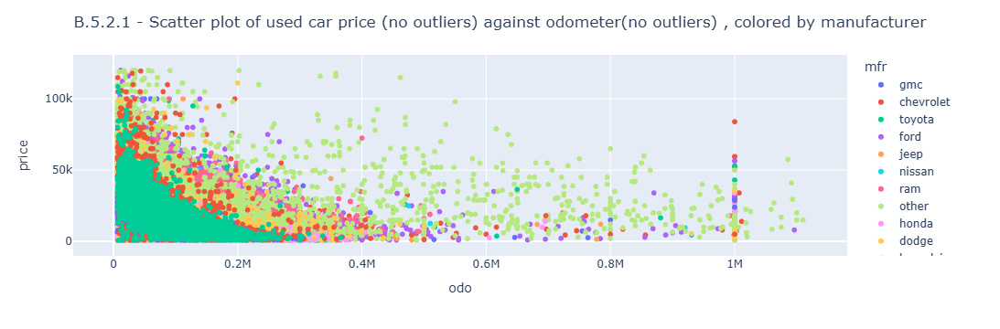

In [51]:
# B.5.2.1 Scatter plot of 'price' against 'odometer' with color by 'manufacturer'
# Limiting the price greater than price_lower_limit and less than price_upper_limit
# Limiting the odometer reading greater than odo_lower_limit and less than odo_upper_limit
fig = px.scatter(cars_df_valid.query('price > @price_lower_limit & price < @price_upper_limit & odo > @odo_lower_limit & odo < @odo_upper_limit'), 
                 x='odo', y='price', color='mfr')
fig.update_layout(title='Scatter plot of used car price against odometer, colored by manufacturer')
fig.update_layout(title={'text': 'B.5.2.1 - Scatter plot of used car price (no outliers) against odometer(no outliers) , colored by manufacturer',
                         'x': 0.5,'xanchor': 'center'})
fig.write_html("plots/B.5.2.1_scatter_plot_price_against_odometer_no_outliers.html")
fig.show()

In [52]:
# B.5.3 Removing price and odometer outliers
cars_df_final = cars_df_valid.query(
    'price > @price_lower_limit & price < @price_upper_limit & odo > @odo_lower_limit & odo < @odo_upper_limit')
cars_df_final

,region,price,year,mfr,model,cond,cyl,fuel,odo,title,trans,drive,size,type,color,state
27,other,33590,2014.0,gmc,other,good,8 cylinders,gas,57923.0,clean,other,other,other,pickup,white,other
28,other,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,other,other,pickup,blue,other
29,other,39590,2020.0,chevrolet,other,good,8 cylinders,gas,19160.0,clean,other,other,other,pickup,red,other
30,other,30990,2017.0,toyota,other,good,8 cylinders,gas,41124.0,clean,other,other,other,pickup,red,other
31,other,15000,2013.0,ford,other,excellent,6 cylinders,gas,128000.0,clean,automatic,rwd,full-size,truck,black,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426874,other,33590,2018.0,other,other,good,6 cylinders,gas,30814.0,clean,automatic,rwd,other,sedan,white,other
426875,other,23590,2019.0,nissan,other,good,6 cylinders,gas,32226.0,clean,other,fwd,other,sedan,other,other
426876,other,30590,2020.0,other,other,good,other,gas,12029.0,clean,other,fwd,other,sedan,red,other
426878,other,28990,2018.0,other,other,good,6 cylinders,gas,30112.0,clean,other,fwd,other,sedan,silver,other


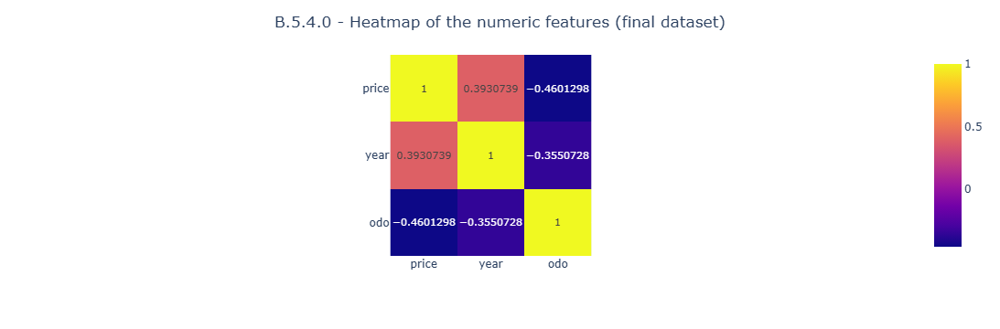

In [53]:
# B.5.4 Heatmap of the numeric features in the final dataset to explore corelation
cars_df_numeric = cars_df_final.select_dtypes(include=np.number)
fig = px.imshow(cars_df_numeric.corr(), text_auto=True)
fig.update_layout(title={'text': 'B.5.4.0 - Heatmap of the numeric features (final dataset)','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/B.5.4.0_heat_map_numeric_features_final_data.html")
fig.show()

<b>B.6 <mark>Creating modeling dataset using One-hot Encoding</mark></b>

In [54]:
# B.6.1 Creating modeling dataset with all numerical features using one-hot encoding
cars_df_modeling = cars_df_final.copy()
categorical_columns = list(cars_df_final.select_dtypes(include='object').columns)

for column in categorical_columns:
    dummies = pd.get_dummies(cars_df_modeling[column], prefix=column, dtype=int)
    cars_df_modeling = pd.concat([cars_df_modeling, dummies], axis=1)
    cars_df_modeling = cars_df_modeling.drop(column, axis=1)

cars_df_modeling

,price,year,odo,region_SF bay area,region_akron / canton,region_albany,region_albuquerque,region_anchorage / mat-su,region_atlanta,region_austin,...,state_ny,state_oh,state_or,state_other,state_pa,state_tn,state_tx,state_va,state_wa,state_wi
27,33590,2014.0,57923.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
28,22590,2010.0,71229.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
29,39590,2020.0,19160.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
30,30990,2017.0,41124.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
31,15000,2013.0,128000.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426874,33590,2018.0,30814.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
426875,23590,2019.0,32226.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
426876,30590,2020.0,12029.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
426878,28990,2018.0,30112.0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [55]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SequentialFeatureSelector as sklearnSequentialFeatureSelector
from mlxtend.feature_selection import SequentialFeatureSelector as mlxtendSequentialFeatureSelector
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

<b>C.1 <mark>Creating Training and Testing data</mark></b>

In [56]:
# C.1 Creating the datasets for modeling with 'price' as dependent variable (predition) and all other features as independent variables (predictors)
y = cars_df_modeling.loc[:, 'price']
X = cars_df_modeling.drop('price', axis=1)

# Splitting the date into Training Set and Testing Set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 32, test_size=.3)

<b>C.2 <mark>Polynomial Regression Modeling</mark></b>

<b>C.2.1 <mark>Feature Selection</mark></b><br>
<b><mark>With 243 features in the modeling dataset, Sequential Feature Selection can be very resource and time consuming. So we will compare only up to 20 features.</mark></b>

In [71]:
# C.2.1 Finding optimal number of features for Linear Regression Model
# Compare average scores of Linear Regression models using Sequential Feature Selection from 1 to 20 features
scores = []
for k in range(1, 21):
    # Initialize mlxtend SequentialFeatureSelector with the k features
    sfs = mlxtendSequentialFeatureSelector(LinearRegression(), k_features=k, forward=True, scoring='neg_mean_squared_error')
    # Fit the SequentialFeatureSelector
    sfs.fit(X_train, y_train)
    # Get the average score for the k features
    scores.append(sfs.get_metric_dict()[k]['avg_score'])

<b><mark>*** NOTE: Sequential Feature Selection from 1 to 20 features above, took more than 8 hours on my laptop.</mark></b>

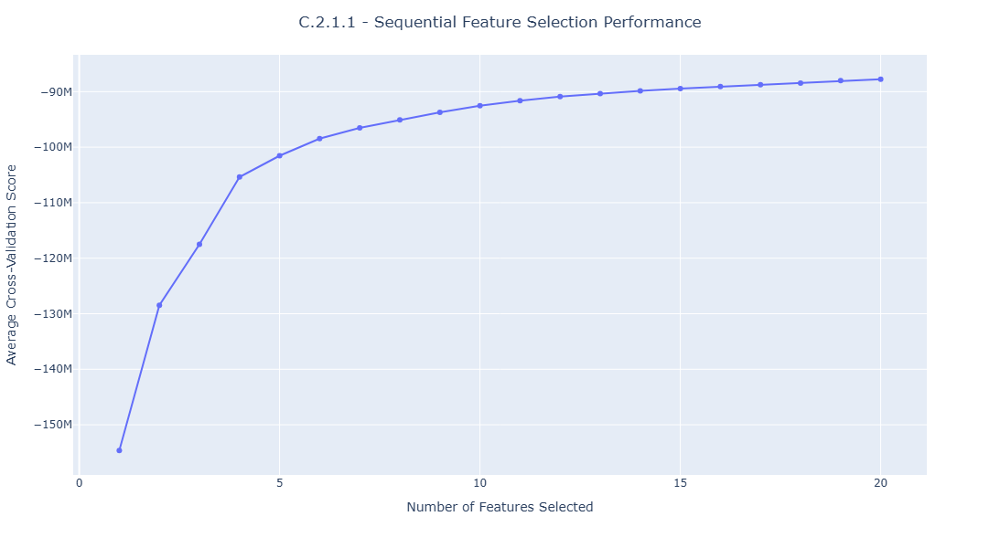

In [74]:
# C.2.1.1  Plot the scores of Linear Regression models to find the optimal number of features (k)
score_data = {
    'Number of Features Selected': range(1, 21),
    'Average Cross-Validation Score': scores
    }
scorey_df = pd.DataFrame(score_data)
fig = px.line(scorey_df, x='Number of Features Selected', y='Average Cross-Validation Score', markers=True, height=600)
fig.update_layout(title={'text': 'C.2.1.1 - Sequential Feature Selection Performance','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/C.2.1.1_sequential_feature_selection_performance.html")
fig.show()

<b>C.2.2 <mark>IMPORTANT NOTE: Beyond 5 features the improvement in model performance is not much as compared to the system resources and time it will need to model large number of features. So we will select upto best 5 features for Polynomial Regression modeling.</mark></b>

In [57]:
# C.2.2.1 Creating Training datasets with 1 to 5 features
bestK_X_trains = []
for k in range(1, 6):
    # Identifying best k feature for Linear Regression
    # Initialize sklearn SequentialFeatureSelector with k feature
    bestK_feature_selector = sklearnSequentialFeatureSelector(LinearRegression(), n_features_to_select = k)
    
    # Fit and transform the SequentialFeatureSelector
    bestK_features = bestK_feature_selector.fit_transform(X_train, y_train)
    
    # Get the best k feature names and create a training dataset with those features
    bestK_X_trains.append(pd.DataFrame(bestK_features, columns=bestK_feature_selector.get_feature_names_out()))
    print(f"Best {k} feature Training Set:\n{bestK_X_trains[k-1]}")

Best 1 feature Training Set:
             odo
0        34330.0
1       155000.0
2       181850.0
3       111481.0
4        85036.0
...          ...
252516  136000.0
252517  300000.0
252518  108996.0
252519   19085.0
252520  583120.0

[252521 rows x 1 columns]
Best 2 feature Training Set:
             odo  fuel_diesel
0        34330.0          0.0
1       155000.0          1.0
2       181850.0          1.0
3       111481.0          0.0
4        85036.0          0.0
...          ...          ...
252516  136000.0          0.0
252517  300000.0          0.0
252518  108996.0          0.0
252519   19085.0          0.0
252520  583120.0          0.0

[252521 rows x 2 columns]
Best 3 feature Training Set:
             odo  fuel_diesel  drive_fwd
0        34330.0          0.0        0.0
1       155000.0          1.0        0.0
2       181850.0          1.0        0.0
3       111481.0          0.0        0.0
4        85036.0          0.0        0.0
...          ...          ...        ...
252516  

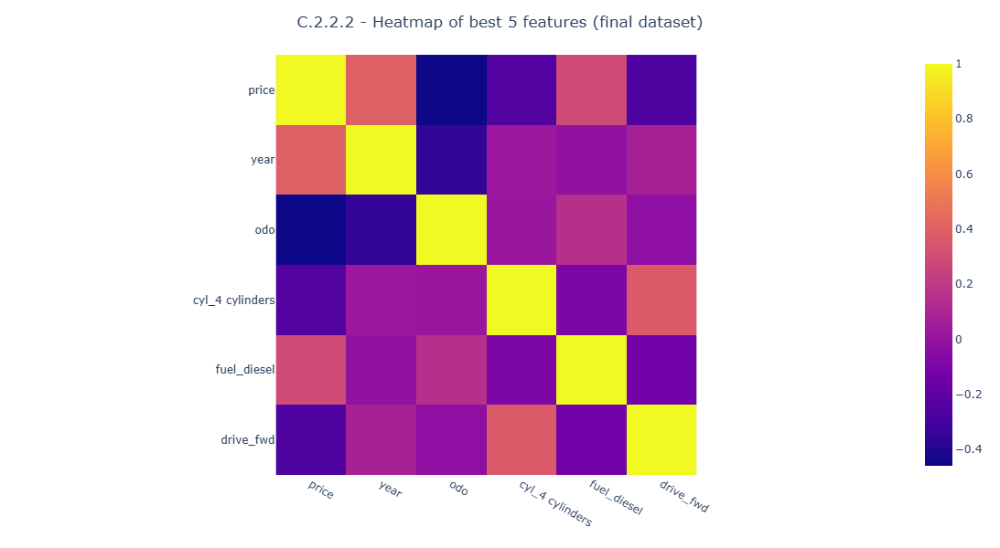

In [58]:
# C.2.2.2 Heatmap of best 5 features and price in the modeling dataset to explore their corelation
cars_df_modeling_top5 = cars_df_modeling[['price','year','odo','cyl_4 cylinders','fuel_diesel','drive_fwd']]
fig = px.imshow(cars_df_modeling_top5.corr(), width=800, height=600)
fig.update_layout(title={'text': 'C.2.2.2 - Heatmap of best 5 features (final dataset)','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/C.2.2.2_heat_map_best5_features_final_data.html")
fig.show()

In [59]:
# C.2.3 Calculating Mean Squared Errors for Polynomial Features of different Degree Complexity (1 to 10)
# across models with 1 to 5 features
best1_X_train = bestK_X_trains[0]
best2_X_train = bestK_X_trains[1]
best3_X_train = bestK_X_trains[2]
best4_X_train = bestK_X_trains[3]
best5_X_train = bestK_X_trains[4]
best1_mses = []
best2_mses = []
best3_mses = []
best4_mses = []
best5_mses = []
max_deg = 10

for i in range(1, max_deg+1):
    best1_pipe = Pipeline([('pfeatures', PolynomialFeatures(degree = i, include_bias=False)), ('linreg', LinearRegression())])
    best1_pipe.fit(best1_X_train, y_train)
    best1_preds = best1_pipe.predict(best1_X_train)
    best1_mses.append(mean_squared_error(y_train, best1_preds))

    best2_pipe = Pipeline([('pfeatures', PolynomialFeatures(degree = i, include_bias=False)), ('linreg', LinearRegression())])
    best2_pipe.fit(best2_X_train, y_train)
    best2_preds = best2_pipe.predict(best2_X_train)
    best2_mses.append(mean_squared_error(y_train, best2_preds))

    best3_pipe = Pipeline([('pfeatures', PolynomialFeatures(degree = i, include_bias=False)), ('linreg', LinearRegression())])
    best3_pipe.fit(best3_X_train, y_train)
    best3_preds = best3_pipe.predict(best3_X_train)
    best3_mses.append(mean_squared_error(y_train, best3_preds))

    best4_pipe = Pipeline([('pfeatures', PolynomialFeatures(degree = i, include_bias=False)), ('linreg', LinearRegression())])
    best4_pipe.fit(best4_X_train, y_train)
    best4_preds = best4_pipe.predict(best4_X_train)
    best4_mses.append(mean_squared_error(y_train, best4_preds))

    best5_pipe = Pipeline([('pfeatures', PolynomialFeatures(degree = i, include_bias=False)), ('linreg', LinearRegression())])
    best5_pipe.fit(best5_X_train, y_train)
    best5_preds = best5_pipe.predict(best5_X_train)
    best5_mses.append(mean_squared_error(y_train, best5_preds))

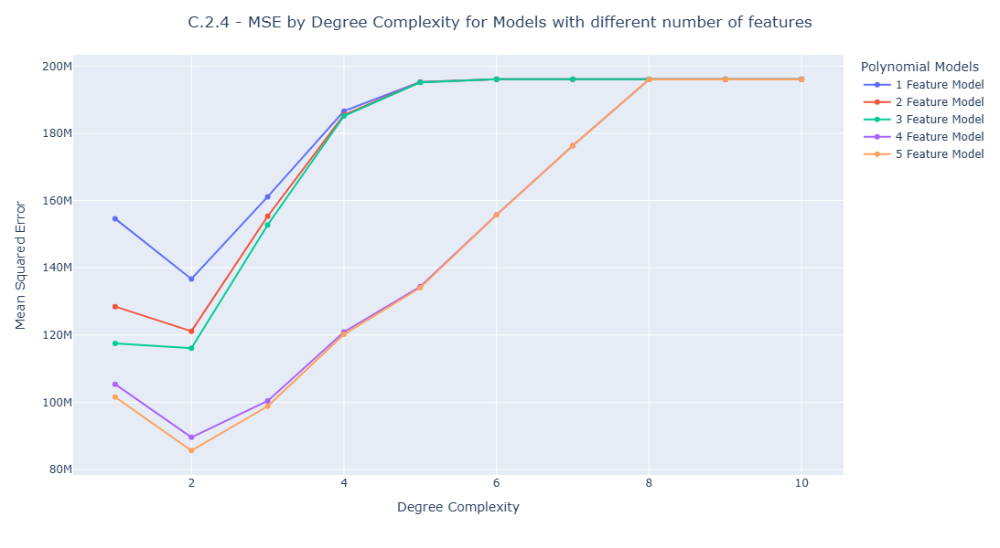

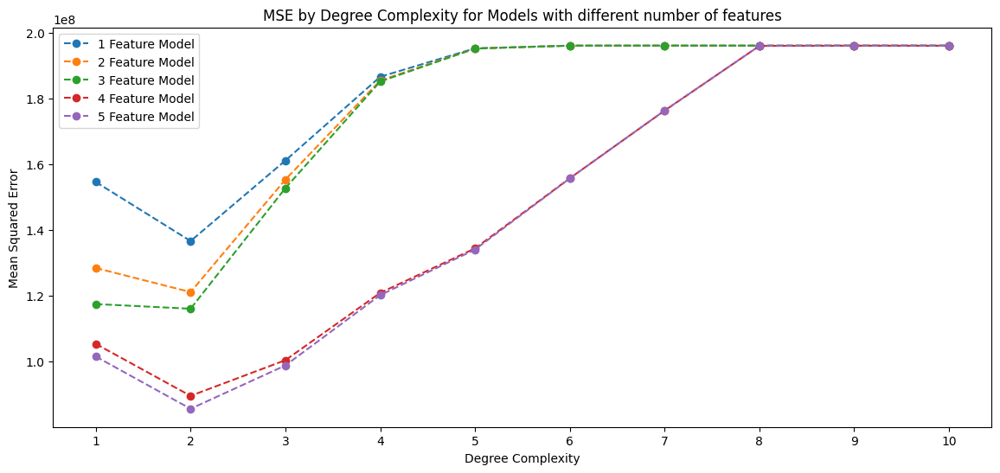

In [85]:
# C.2.4 Plotting Mean Squared Errors for Polynomial Features of different Degree Complexity (1 to 10) 
# across models with 1 to 5 features
# Plotting data using matplotlib as well as plotly to compare the strengths (better visual vs interactivity)  

# matplotlib plot
plt.figure(figsize=(14, 6))
plt.plot(range(1, max_deg+1), best1_mses, '--o', label = '1 Feature Model')
plt.plot(range(1, max_deg+1), best2_mses, '--o', label = '2 Feature Model')
plt.plot(range(1, max_deg+1), best3_mses, '--o', label = '3 Feature Model')
plt.plot(range(1, max_deg+1), best4_mses, '--o', label = '4 Feature Model')
plt.plot(range(1, max_deg+1), best5_mses, '--o', label = '5 Feature Model')
plt.xticks(range(1, max_deg+1), range(1, max_deg+1))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.title('MSE by Degree Complexity for Models with different number of features')
plt.legend();

# plotly Line plot
complexity_data = {
    'Degree Complexity': range(1, max_deg+1),
    '1 Feature Model': best1_mses,
    '2 Feature Model': best2_mses,
    '3 Feature Model': best3_mses,
    '4 Feature Model': best4_mses,
    '5 Feature Model': best5_mses
    }
complexity_df = pd.DataFrame(complexity_data)
fig = px.line(complexity_df, x='Degree Complexity', 
              y=['1 Feature Model', '2 Feature Model', '3 Feature Model', '4 Feature Model', '5 Feature Model'], markers=True, height=600)
fig.update_layout(yaxis_title="Mean Squared Error")
fig.update_layout(legend_title_text="Polynomial Models")
fig.update_layout(title={'text': 'C.2.4 - MSE by Degree Complexity for Models with different number of features','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/C.2.4_mse_by_degree_for_best_n_features.html")
fig.show()

<b>C.2.5 <mark>Best Polynomial Regression Model: Model with folloing 5 features and degree of 2</mark></b>
1. Year
2. Odometer
3. 4 Cylinders
4. Diesel Fuel
5. Forward Drive

<b>C.2.6 <mark>Validating the best Polynomial Regression Model with folloing 5 features and degree of 2</mark></b>

In [61]:
# C.2.6.1 Create Testing dataset for model with best 5 features
best5_X_test = X_test[['year','odo','cyl_4 cylinders','fuel_diesel','drive_fwd']]
best5_X_test

,year,odo,cyl_4 cylinders,fuel_diesel,drive_fwd
330980,2019.0,14054.0,0,0,0
5199,2013.0,112056.0,1,0,0
174968,2013.0,120451.0,1,0,0
19458,2016.0,24661.0,0,0,0
223226,2015.0,138000.0,0,1,0
...,...,...,...,...,...
167795,2019.0,9313.0,0,0,0
135869,2005.0,193000.0,1,0,0
253898,2006.0,100000.0,0,0,0
400862,2012.0,83552.0,0,0,0


In [62]:
# C.2.6.2 Calculating Training and Testing MSE for model with best 5 features
train_mses = []
test_mses = []
max_deg = 10
for i in range(1, max_deg+1):
    pipe = Pipeline([('pfeatures', PolynomialFeatures(degree = i, include_bias=False)),
                    ('linreg', LinearRegression())])
    pipe.fit(best5_X_train, y_train)
    train_preds = pipe.predict(best5_X_train)
    test_preds = pipe.predict(best5_X_test)
    train_mses.append(mean_squared_error(y_train, train_preds))
    test_mses.append(mean_squared_error(y_test, test_preds))

print(f'The model degree complexity with minimum test Error is: {test_mses.index(min(test_mses)) + 1}')

The model degree complexity with minimum test Error is: 2


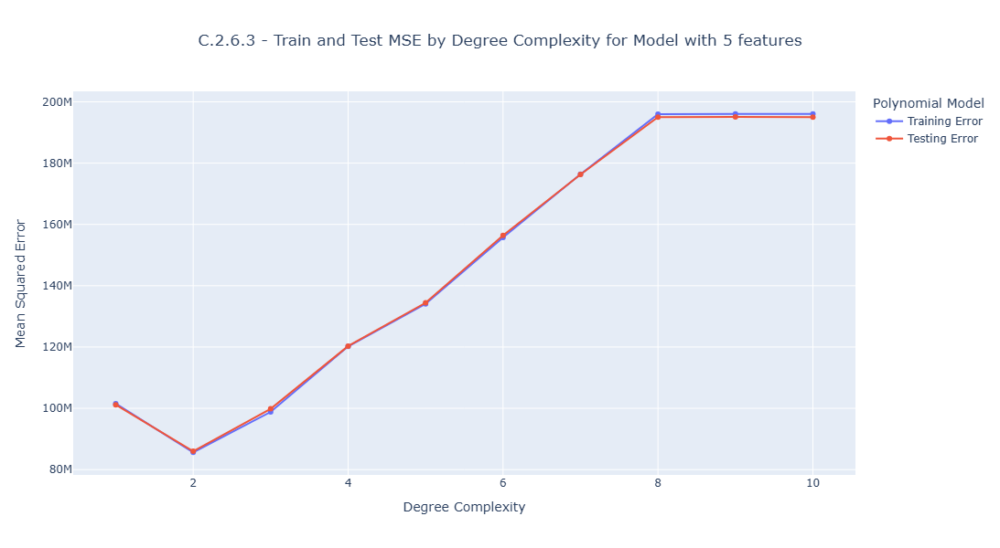

In [86]:
# C.2.6.3 Plotting Mean Squared Errors of various Degree Complexity (1 to 10) for polynomial model with best 5 features
complexity_data = {
    'Degree Complexity': range(1, max_deg+1),
    'Training Error': train_mses,
    'Testing Error': test_mses
    }
complexity_df = pd.DataFrame(complexity_data)
fig = px.line(complexity_df, x='Degree Complexity', y=['Training Error', 'Testing Error'], 
              title='Train and Test MSE by Degree Complexity for Model with 5 features', markers=True, height=600)
fig.update_layout(yaxis_title="Mean Squared Error")
fig.update_layout(legend_title_text="Polynomial Model")
fig.update_layout(title={'text': 'C.2.6.3 - Train and Test MSE by Degree Complexity for Model with 5 features','x': 0.5,'xanchor': 'center'})
fig.write_html("plots/C.2.6.3_train_test_mse_by_degree_for_best_5_features.html")
fig.show()

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high-quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight into drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

<b>D.1 <mark>Polynomial Model Validation:</mark></b><br>
<b><mark>The lowest test Mean Squared Error (MSE) is for the Polynomial Regression Model of degree 2 using the folloing 5 features.</mark></b><br>
1. Year
2. Odometer
3. 4 Cylinders
4. Diesel Fuel
5. Forward Drive
<b><mark>Lowest test Mean Squared Error (MSE) value = 86.00627 Million</mark></b><br>
This means <b><mark>an average error of about $9,274</mark></b> in predicting the price of a used car. This may be a moderate deviation that is still useful to predict the price of a used car but to me it seems like <b><mark>this may NOT be the best model possible</mark></b>.

<b>D.2 <mark>Conclusion:</mark></b><br>
As a consultant to a used car dealership, I'm not convinsed to use this model to provide recommendations to my client for fine-tuning their used car inventory to maximize sales. Instead, <b><mark>I would like to explore other regression models like Random Forest or XGBoost (Gradient Boosting)</mark></b> that might result in lower average error than what we have got with Polynomial Regression.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine-tuning their inventory.

<b>A. Steps I tool to understand the data:</b>
1. Explored the data using Pandas Dataframe and its supported functions like info() for schema and datatype info and describe() for basic statistical information.
2. Found features with missing values and undersatnd amount of data with missing values per feature.
3. Found unique values of each feature.
4. Investigated duplicate records.
5. Performed Exploratory Data Analysis (EDA) on the dataset by generating appropriate plots.
6. Observed numerical vs categorical features of the data.
7. Observed features that are not correlated to price of used cars.

<b>B. Steps I took to prepare the data:</b>
1. Dropped <b>68 records with all the feature values missing</b>.
2. Dropped <b>features id and VIN</b> that are <b>not related to the price of used cars</b>.
3. Dropped <b>5,468 records with missing values of the numerical features</b>.
4. Handled all categorical features to <b>enable one-hot encoding</b>.
5. Handled <b>outliers in Price and Odometer data</b> values.
6. Created modeling data with <b>all numerical features using one-hot encoding</b>.

<b>C. Steps I took to model the data using Polynomial Regression:</b>
1. With 243 features in the modeling dataset (after one-hot encoding), <b>I used Sequential Feature Selection to select optimum number of features</b> for Linear regression based on average coss-validation score as negative MSE. The optimum number of features was five.
3. Compared different <b>Polynomial regression models with 1 to 5 Sequential Feature Selection and Polynomial feature (degree complexity) from 1 to 10</b> using MSE.
4. Using training data the <b>best Polynomial regression model based on minimum MSE had 5 features (Year, Odometer, 4 cylinders, Diesel Fuel, and Forward Drive) and degree of 2</b>.
5. Validated the identified best Polynomial regression model using the testing dataset. The <b>best Polynomial regression model based on training data minimum MSE was still the same (5 features and degree of 2)</b>.
6. The minimum MSE using the testing data was 86.00627 Million - that means <b>an average error of of about $9,274 to predict the price of a used car</b>.

<b>D. Conclusion:</b><br>
An <b>average error of about $9,274</b> may be useful to predict the price of a used car but it seems like <b><mark>this may NOT be the best model possible</mark></b>. I would explore other regression models like Random Forest or XGBoost (Gradient Boosting) that might result in lower average error.